In [432]:
import geopandas as gpd
from sqlalchemy import create_engine
import psycopg2
import pandas as pd
import geoalchemy2
import numpy as np
from tqdm import tqdm
tqdm.pandas()
from datetime import datetime

In [433]:
# функция для чтения того, что получили в запросе
def select_pg(sql, geom):
    return gpd.read_postgis(sql, engine, geom_col = 'geom', crs = 3857)

engine = create_engine('postgresql+psycopg2://kb_geo:kYZQK90yvE8aNi54ELINc0yJ1gu6wo7h@\
db03.cluster.strlk.ru/kb_graph')

In [ ]:
vk_photo_msk_spb = select_pg('select * from photo_path.vk_photo_msk_spb', engine)
#выбируем фото не на москву и на питер 
vk_photo_msk_spb_part = vk_photo_msk_spb[(vk_photo_msk_spb['photo_city'] !='Москва')&(vk_photo_msk_spb['photo_city'] !='Санкт-Петербург')]

#границы региона 
boundary_msk_spb = select_pg('select * from boundary_msk_spb', engine)

In [ ]:
# Выполнение операции пересечения
merged = gpd.sjoin(vk_photo_msk_spb_part, boundary_msk_spb, op='intersects')

vk_photo_msk_spb_main = vk_photo_msk_spb_part[~vk_photo_msk_spb_part['id'].isin(merged[merged['city_left'] == merged['city_right']]['id_left'])]

c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\IPython\core\interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [438]:
vk_photo = vk_photo_msk_spb_main[['id','geom', 'url', 'date_time', 'owner_id']]

In [440]:
# перевод даты в формате даты
vk_photo['date_time'] = pd.to_datetime(vk_photo['date_time'], format='%Y-%m-%d %H:%M:%S')

c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [441]:
vk_photo['ts_d'] = 0
#формат - количество секунд с определенной даты
vk_photo['ts'] = vk_photo['date_time'].progress_apply(lambda x: x.timestamp())

c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
100%|██████████| 2026019/2026019 [00:15<00:00, 130039.45it/s]
c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
vk_photo.head()

,id,geom,url,date_time,owner_id,ts_d,ts,day,month
0,28548490,POINT (4161999.318 7523182.670),https://sun9-10.userapi.com/impg/eb1zB31laJiBw...,2022-09-15 05:52:58+00:00,402185825,0,1.663221e+09,15,9
1,28548541,POINT (3351685.932 8303017.483),https://sun9-10.userapi.com/impg/sUA0G4GvESNne...,2022-09-17 18:49:49+00:00,148861652,0,1.663441e+09,17,9
4,28548672,POINT (3389853.934 8330225.219),https://sun9-39.userapi.com/impg/WGW5Av-azftmx...,2022-10-02 19:01:44+00:00,338901084,0,1.664737e+09,2,10
9,28548692,POINT (4214199.476 7543563.123),https://sun9-27.userapi.com/impg/bl24zsYQolTLe...,2022-08-28 16:09:32+00:00,54734647,0,1.661703e+09,28,8
10,28548838,POINT (3353580.367 8303676.295),https://sun9-77.userapi.com/impg/THcVs68AvS1Fq...,2022-08-14 15:08:40+00:00,868788,0,1.660490e+09,14,8


In [442]:
# выбор дня и месяца из даты
vk_photo['day'] = vk_photo['date_time'].dt.day
vk_photo['month'] = vk_photo['date_time'].dt.month

c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\geopandas\geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
import hdbscan

In [444]:
#сохраняются те строки 'ts' имеет более 2 значений.
vk_photo = vk_photo.groupby(['owner_id']).filter(lambda x: x['ts'].count() > 2)

In [517]:
vk_photo_with_nodes = select_pg('select *, ST_MakePoint(lng, lat) as geom from vk_photo_with_nodes', engine)

In [522]:
vk_photo_with_nodes['geom'] = vk_photo_with_nodes['geom'].to_crs(3857)

In [529]:
vk_photo_main = vk_photo.merge(vk_photo_with_nodes[['nodes', 'id']], on=['id'], how='inner', indicator=True)

In [524]:
vk_photo_with_nodes = gpd.GeoDataFrame(vk_photo_with_nodes, geometry= gpd.points_from_xy(vk_photo_with_nodes.lng,vk_photo_with_nodes.lat), crs = 3857)

In [511]:
vk_photo

,id,geom,url,date_time,owner_id,ts_d,ts,day,month
0,28548490,POINT (4161999.318 7523182.670),https://sun9-10.userapi.com/impg/eb1zB31laJiBw...,2022-09-15 05:52:58+00:00,402185825,0,1.663221e+09,15,9
1,28548541,POINT (3351685.932 8303017.483),https://sun9-10.userapi.com/impg/sUA0G4GvESNne...,2022-09-17 18:49:49+00:00,148861652,0,1.663441e+09,17,9
4,28548672,POINT (3389853.934 8330225.219),https://sun9-39.userapi.com/impg/WGW5Av-azftmx...,2022-10-02 19:01:44+00:00,338901084,0,1.664737e+09,2,10
9,28548692,POINT (4214199.476 7543563.123),https://sun9-27.userapi.com/impg/bl24zsYQolTLe...,2022-08-28 16:09:32+00:00,54734647,0,1.661703e+09,28,8
10,28548838,POINT (3353580.367 8303676.295),https://sun9-77.userapi.com/impg/THcVs68AvS1Fq...,2022-08-14 15:08:40+00:00,868788,0,1.660490e+09,14,8
...,...,...,...,...,...,...,...,...,...
3234810,28547891,POINT (4147964.379 8108650.594),https://sun9-79.userapi.com/impg/1dkWQ4q0ssQSD...,2022-07-17 17:18:34+00:00,35976571,0,1.658078e+09,17,7
3234820,28548246,POINT (4101911.283 7542749.142),https://sun9-9.userapi.com/impg/Z5aLREuK4Xnz8S...,2022-01-18 12:07:24+00:00,2469644,0,1.642508e+09,18,1
3234822,28548248,POINT (4193306.033 7513357.863),https://sun9-49.userapi.com/impg/dEfcTiCSXFHfg...,2022-08-31 20:49:02+00:00,132896475,0,1.661979e+09,31,8
3234823,28548021,POINT (3390135.461 8329962.107),https://sun9-51.userapi.com/impg/lF-Fd5ODk3iw7...,2022-08-26 21:24:31+00:00,30069177,0,1.661549e+09,26,8


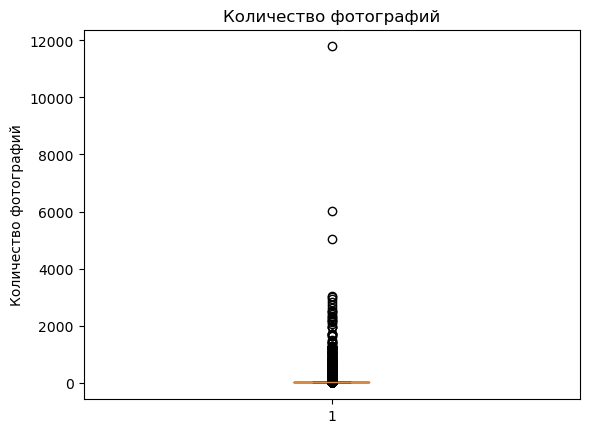

In [455]:
import matplotlib.pyplot as plt

# Здесь vk_photo исходный DataFrame с данными о фотографиях
data_to_plot = vk_photo.groupby('owner_id')['id'].count()

# Построение box plot'а
fig, ax = plt.subplots()
ax.boxplot(data_to_plot, vert=True)

# Название графика и осей
ax.set_title('Количество фотографий')
ax.set_xlabel('')
ax.set_ylabel('Количество фотографий')

# Отображение графика
plt.show()


In [459]:
#мединанное количество фотографий - 7 штук (75% - 16)
data_describe = vk_photo.groupby('owner_id')['id'].count().describe()
data_describe

count    101963.000000
mean         19.168169
std          74.545149
min           3.000000
25%           4.000000
50%           7.000000
75%          16.000000
max       11789.000000
Name: id, dtype: float64

In [ ]:
#мединанное количество фотографий - 7 штук (75% - 16)
data_describe = vk_photo.groupby('owner_id')['id'].count().describe()
data_describe

In [466]:
grouped_data = vk_photo.groupby('owner_id').agg({'owner_id': 'count', 'date_time': np.ptp})


In [471]:
#мединанное количество  дней между фотками 25 days 10:24:10
grouped_data['date_time'].describe()

count                        101963
mean     70 days 14:34:51.427390327
std      88 days 22:18:19.262287679
min                 0 days 00:00:00
25%                 0 days 00:03:25
50%                25 days 10:24:10
75%               124 days 17:09:45
max               364 days 17:03:51
Name: date_time, dtype: object

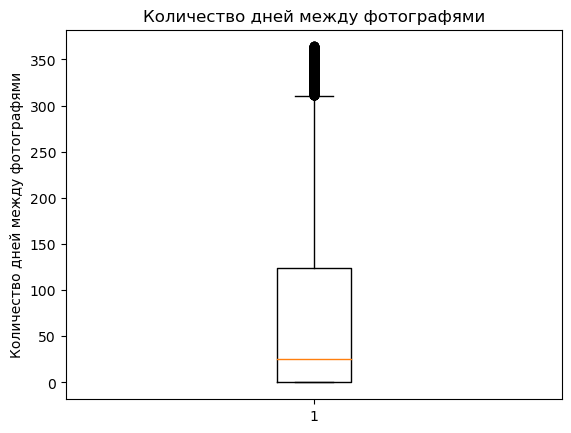

In [481]:
import matplotlib.pyplot as plt

# Построение box plot'а
fig, ax = plt.subplots()

ax.boxplot(grouped_data['date_time'].dt.days, vert=True)

# Название графика и осей
ax.set_title('Количество дней между фотографями')
ax.set_xlabel('')
ax.set_ylabel('Количество дней между фотографями')

# Отображение графика
plt.show()

In [490]:
count_photo_each_day = vk_photo[['owner_id', 'day', 'month']].value_counts().reset_index().rename(columns={0: 'count'})

,owner_id,day,month,count
0,391442350,20,11,1249
1,204445949,11,12,644
2,24807193,20,6,572
3,117134944,20,8,569
4,7494481,6,4,526
...,...,...,...,...
410753,256363949,21,7,1
410754,256363949,23,9,1
410755,256363949,24,9,1
410756,256363949,26,9,1


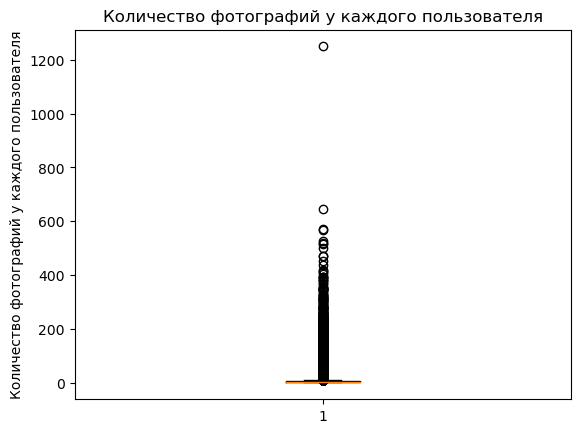

In [496]:
import matplotlib.pyplot as plt

# Построение box plot'а
fig, ax = plt.subplots()

ax.boxplot(count_photo_each_day['count'], vert=True)

# Название графика и осей
ax.set_title('Количество фотографий у каждого пользователя')
ax.set_xlabel('')
ax.set_ylabel('Количество фотографий у каждого пользователя')

# Отображение графика
plt.show()

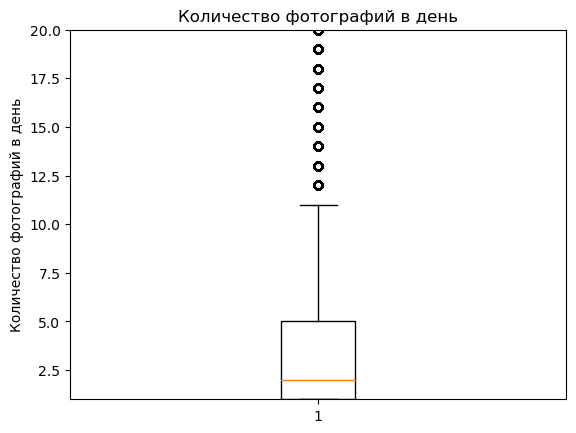

In [503]:
import matplotlib.pyplot as plt

# Построение box plot'а
fig, ax = plt.subplots()

ax.boxplot(count_photo_each_day['count'], vert=True)

# Название графика и осей
ax.set_title('Количество фотографий в день')
ax.set_xlabel('')
ax.set_ylabel('Количество фотографий в день')

plt.ylim([1, 20])

# Отображение графика
plt.show()

In [577]:
lng_list = vk_photo_main.groupby(['owner_id', 'day', 'month'])['lng_3857'].count()

In [ ]:
vk_photo_main['lng_3857'] = vk_photo_main['geom'].x
vk_photo_main['lat_3857'] = vk_photo_main['geom'].y


lng_list = vk_photo_main.groupby(['owner_id', 'day', 'month'])['lng_3857'].apply(list).reset_index()['lng_3857'].tolist()
lat_list = vk_photo_main.groupby(['owner_id', 'day', 'month'])['lat_3857'].apply(list).reset_index()['lat_3857'].tolist()
node = vk_photo_main.groupby(['owner_id', 'day', 'month'])['nodes'].apply(list).reset_index()['nodes'].tolist()

count_photo_each_day['node'] = vk_photo_with_nodes
count_photo_each_day['lng_list'] = lng_list
count_photo_each_day['lat_list'] = lat_list

,owner_id,day,month,id
0,1294,1,5,3
1,1294,2,10,4
2,1294,6,5,9
3,1294,10,5,4
4,1294,12,8,2
...,...,...,...,...
410753,772898532,25,12,14
410754,773101149,27,12,5
410755,773472739,30,12,8
410756,773484462,27,12,5


In [575]:
count = vk_photo_main.groupby(['owner_id', 'day', 'geom'])['id'].count().reset_index()[vk_photo_main.groupby(['owner_id', 'day', 'month'])['id'].count().reset_index()['id'] > 1]

TypeError: '<' not supported between instances of 'Point' and 'Point'

In [573]:
count_photo = count_photo_each_day.merge(count, on = ['owner_id', 'day', 'month'])

In [574]:
count_photo

,owner_id,day,month,count,lng_list,lat_list,node,id
0,391442350,20,11,1249,"[3488641.188011928, 3488304.3352327878, 349152...","[8335585.886089783, 8336383.136871351, 8327734...","[2224109, 757312, 1816417]",1249
1,204445949,11,12,644,"[3423205.364933826, 3423231.5250141625, 342320...","[8344642.34903808, 8344620.250898169, 8344667....","[605970, 605970, 605970, 605970]",644
2,24807193,20,6,572,"[3773786.174998389, 3774910.2792164194, 377414...","[8048739.653578496, 8049718.910311517, 8049587...","[1873363, 1880452, 1898951, 1100775, 1880487, ...",572
3,117134944,20,8,569,"[3785017.643702486, 3789282.9613117203, 378730...","[8033442.839259657, 8027087.2988413805, 803206...","[1920077, 1899913, 1899922, 1899922]",569
4,7494481,6,4,526,"[3191025.5237498595, 3214393.488618202]","[8478527.702882793, 8461808.217766479]","[1288564, 439451]",526
...,...,...,...,...,...,...,...,...
256035,235311671,27,8,2,"[4016738.40330642, 4017440.3840153627, 4017440...","[7819171.832374702, 7789854.997306574, 7789854...","[585532, 2075411, 2075411, 2098833, 2076610]",2
256036,236907689,27,1,2,"[4172645.58030305, 4172608.9561905796, 4172644...","[7444674.592514636, 7444634.968275849, 7444657...","[1795140, 1795118, 1795140]",2
256037,596488917,15,1,2,"[3534671.797454947, 3534671.797454947]","[8381058.580874153, 8381058.580874153]","[1814745, 1814745]",2
256038,194509201,7,10,2,[3373213.1174524566],[8474997.708143404],[1074810],2


In [553]:
from tqdm import tqdm
from shapely.geometry import LineString

tqdm.pandas(desc='Creating LineString')

def create_linestring(row):
    zipped_list = zip(row.lng_list, row.lat_list)
    return LineString(zipped_list)

count_photo_each_day['geometry'] = count_photo_each_day.progress_apply(create_linestring, axis=1)

# df_3 = df_1.reset_index()
# df_3 = gpd.GeoDataFrame(df_3, geometry = df_3['geometry'])
# df_1['length'] = df_1['geometry'].length

Creating LineString:   0%|          | 9/410758 [00:00<4:18:30, 26.48it/s] 


GEOSException: IllegalArgumentException: point array must contain 0 or >1 elements


In [546]:
count_photo_each_day['lng_list']

,owner_id,day,month,count
0,391442350,20,11,1249
1,204445949,11,12,644
2,24807193,20,6,572
3,117134944,20,8,569
4,7494481,6,4,526
...,...,...,...,...
410753,256363949,21,7,1
410754,256363949,23,9,1
410755,256363949,24,9,1
410756,256363949,26,9,1


In [539]:
vk_photo_main

,id,geom,url,date_time,owner_id,ts_d,ts,day,month,nodes,_merge
0,28548490,POINT (4161999.318 7523182.670),https://sun9-10.userapi.com/impg/eb1zB31laJiBw...,2022-09-15 05:52:58+00:00,402185825,0,1.663221e+09,15,9,1538463,both
1,28548541,POINT (3351685.932 8303017.483),https://sun9-10.userapi.com/impg/sUA0G4GvESNne...,2022-09-17 18:49:49+00:00,148861652,0,1.663441e+09,17,9,1707439,both
2,28548672,POINT (3389853.934 8330225.219),https://sun9-39.userapi.com/impg/WGW5Av-azftmx...,2022-10-02 19:01:44+00:00,338901084,0,1.664737e+09,2,10,660690,both
3,28548692,POINT (4214199.476 7543563.123),https://sun9-27.userapi.com/impg/bl24zsYQolTLe...,2022-08-28 16:09:32+00:00,54734647,0,1.661703e+09,28,8,861576,both
4,28548838,POINT (3353580.367 8303676.295),https://sun9-77.userapi.com/impg/THcVs68AvS1Fq...,2022-08-14 15:08:40+00:00,868788,0,1.660490e+09,14,8,632124,both
...,...,...,...,...,...,...,...,...,...,...,...
1954439,28547891,POINT (4147964.379 8108650.594),https://sun9-79.userapi.com/impg/1dkWQ4q0ssQSD...,2022-07-17 17:18:34+00:00,35976571,0,1.658078e+09,17,7,2049689,both
1954440,28548246,POINT (4101911.283 7542749.142),https://sun9-9.userapi.com/impg/Z5aLREuK4Xnz8S...,2022-01-18 12:07:24+00:00,2469644,0,1.642508e+09,18,1,2276843,both
1954441,28548248,POINT (4193306.033 7513357.863),https://sun9-49.userapi.com/impg/dEfcTiCSXFHfg...,2022-08-31 20:49:02+00:00,132896475,0,1.661979e+09,31,8,1761402,both
1954442,28548021,POINT (3390135.461 8329962.107),https://sun9-51.userapi.com/impg/lF-Fd5ODk3iw7...,2022-08-26 21:24:31+00:00,30069177,0,1.661549e+09,26,8,616414,both


In [532]:

import matplotlib.pyplot as plt

# Построение box plot'а
fig, ax = plt.subplots()

ax.boxplot(count_photo_each_day['count'], vert=True)

# Название графика и осей
ax.set_title('Количество фотографий в день')
ax.set_xlabel('')
ax.set_ylabel('Количество фотографий в день')

plt.ylim([1, 20])

# Отображение графика
plt.show()

owner_id   day  month
1294       1    5         3
           2    10        4
           6    5         9
           10   5         4
           12   8         2
                         ..
772898532  25   12       14
773101149  27   12        5
773472739  30   12        8
773484462  27   12        5
773838561  29   12       10
Name: nodes, Length: 410758, dtype: int64

In [507]:
count_photo_each_day['coords'] = vk_photo.groupby(['owner_id', 'day', 'month'])['geom'].progress_apply(lambda x: list(x.coords[0]))
#  = vk_photo.geometry

  0%|          | 1/410758 [00:02<316:00:42,  2.77s/it]


AttributeError: 'GeoSeries' object has no attribute 'coords'

In [493]:
vk_photo[vk_photo['owner_id'] == 204445949]['url']

510        https://sun9-3.userapi.com/impg/5KntsFIwc_qZ1I...
5173       https://sun9-43.userapi.com/impg/LrW_aR1dRBvML...
5620       https://sun9-70.userapi.com/impg/bPc5uJG7XNqlC...
7830       https://sun9-56.userapi.com/impg/o76iiXv7GW5H_...
8742       https://sun9-24.userapi.com/impg/X3mvffEIONv-a...
                                 ...                        
3216566    https://sun9-63.userapi.com/impg/_PLsgEkwKxo5R...
3216809    https://sun9-23.userapi.com/impg/77biLobJ4Hfmj...
3220468    https://sun9-47.userapi.com/impg/W2VyP502L9NKx...
3220865    https://sun9-49.userapi.com/impg/0V3-W7hAQOweh...
3228732    https://sun9-69.userapi.com/impg/qr9vv5LXM4CiF...
Name: url, Length: 644, dtype: object

In [ ]:
def groupby_cluster(X):
    db = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=1, cluster_selection_epsilon=1*24*60*60*1).fit(X) #epsilon - количество секунд, которые могут разделять один кластер, сейчас макс. расстояние между точками кластера - 24 часа, этот параметр можно и нужно настраивать
    return pd.DataFrame(db.labels_, index=X.index)

In [ ]:
db_1 = vk_photo.groupby(['owner_id'], as_index=False)[['ts', 'ts_d']].progress_apply(groupby_cluster)

100%|█████████▉| 101948/101963 [05:32<00:00, 346.01it/s]c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\tqdm\std.py:805: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  return getattr(df, df_function)(wrapper, **kwargs)
100%|██████████| 101963/101963 [05:38<00:00, 301.57it/s]


In [333]:
def groupby_cluster(X):
    db = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=1, cluster_selection_epsilon=1*24*60*60*3).fit(X) #epsilon - количество секунд, которые могут разделять один кластер, сейчас макс. расстояние между точками кластера - 24 часа, этот параметр можно и нужно настраивать
    return pd.DataFrame(db.labels_, index=X.index)

In [334]:
db_3 = vk_photo.groupby(['owner_id'], as_index=False)[['ts', 'ts_d']].progress_apply(groupby_cluster)

Creating LineString: 100%|█████████▉| 101942/101963 [06:32<00:00, 379.27it/s]c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\tqdm\std.py:805: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  return getattr(df, df_function)(wrapper, **kwargs)
Creating LineString: 100%|██████████| 101963/101963 [06:36<00:00, 257.05it/s]


In [335]:
def groupby_cluster(X):
    db = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=1, cluster_selection_epsilon=1*24*60*60*7).fit(X) #epsilon - количество секунд, которые могут разделять один кластер, сейчас макс. расстояние между точками кластера - 24 часа, этот параметр можно и нужно настраивать
    return pd.DataFrame(db.labels_, index=X.index)

In [336]:
db_7 = vk_photo.groupby(['owner_id'], as_index=False)[['ts', 'ts_d']].progress_apply(groupby_cluster)

Creating LineString: 100%|█████████▉| 101946/101963 [05:13<00:00, 367.69it/s]c:\Users\apikuleva\Anaconda3\envs\graph\lib\site-packages\tqdm\std.py:805: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  return getattr(df, df_function)(wrapper, **kwargs)
Creating LineString: 100%|██████████| 101963/101963 [05:19<00:00, 318.75it/s]


In [337]:
# clusters_1 = db_1[0].to_list()
# vk_photo['cluster_1'] = clusters_1

clusters_3 = db_3[0].to_list()
vk_photo['cluster_3'] = clusters_3

clusters_7 = db_7[0].to_list()
vk_photo['cluster_7'] = clusters_7

In [ ]:
vk_photo

,id,geom,url,date_time,owner_id,ts_d,ts,cluster_1,cluster_3,cluster_7
2,74786990,POINT (4336874.557 7518684.888),https://sun9-63.userapi.com/impg/UfQwL2FsMYcPF...,2022-08-23 14:48:22+00:00,746100458,0,1.661266e+09,0,0,0
4,74787284,POINT (4220825.324 7497385.392),https://sun9-15.userapi.com/impg/rf5PMD6gb6a3o...,2022-09-19 14:13:39+00:00,144149601,0,1.663597e+09,2,2,2
5,74787447,POINT (3566896.898 8277024.142),https://sun9-16.userapi.com/impg/B0b_wSHhaY-Kk...,2022-10-10 15:35:25+00:00,1187330,0,1.665416e+09,2,2,2
7,74787539,POINT (3996325.080 7732087.615),https://sun9-44.userapi.com/impg/45pDCL8c4XSyS...,2022-08-21 06:01:58+00:00,480004459,0,1.661062e+09,17,9,7
9,74788038,POINT (3383335.065 8336404.548),https://sun9-30.userapi.com/impg/bDnQ0SBILrveM...,2022-10-06 15:29:40+00:00,630599216,0,1.665070e+09,1,1,1
...,...,...,...,...,...,...,...,...,...,...
3234823,74785576,POINT (4165409.813 7491462.220),https://sun9-58.userapi.com/impg/vL2bdsMnWB3wl...,2022-07-13 14:23:04+00:00,170942033,0,1.657722e+09,1,1,1
3234824,74785875,POINT (3452194.074 8374249.346),https://sun9-51.userapi.com/impg/gYpBFNyKEAavT...,2022-08-07 06:52:50+00:00,642844280,0,1.659855e+09,2,2,2
3234825,74786131,POINT (4171821.148 7537285.157),https://sun9-55.userapi.com/impg/wtTV4j1fPHb4g...,2022-07-04 20:44:41+00:00,588356205,0,1.656967e+09,-1,-1,-1
3234826,74786172,POINT (3396777.784 7628128.374),https://sun9-52.userapi.com/impg/wmwMNsgFmAzKR...,2022-07-09 05:49:47+00:00,342131648,0,1.657346e+09,1,1,1


In [338]:
vk_photo['geom'] = vk_photo['geom'].to_crs(4326)

In [339]:
vk_photo['coords'] = vk_photo.geometry.progress_apply(lambda x: list(x.coords[0]))

Creating LineString: 100%|██████████| 1954444/1954444 [01:38<00:00, 19936.75it/s]


In [340]:
# vk_photo_clust_1 = vk_photo[vk_photo['cluster_1'] != -1]
vk_photo_clust_3 = vk_photo[vk_photo['cluster_3'] != -1]
vk_photo_clust_7 = vk_photo[vk_photo['cluster_7'] != -1]

In [341]:
vk_photo_clust_3 = vk_photo_clust_3.drop_duplicates(subset=['geom', 'owner_id', 'cluster_3'], keep='first')
vk_photo_clust_7 = vk_photo_clust_7.drop_duplicates(subset=['geom', 'owner_id', 'cluster_7'], keep='first')

In [263]:
# vk_photo_clust_1.groupby(['owner_id', 'cluster_1']).filter(lambda x: x['id'].count() > 1)

vk_photo_clust_1_new = vk_photo_clust_1.merge(
vk_photo_clust_1[['owner_id', 'cluster_1']].value_counts().reset_index().rename(columns={0: 'count'})[
vk_photo_clust_1[['owner_id', 'cluster_1']].value_counts().reset_index().rename(columns={0: 'count'})['count'] > 1], on = ['owner_id', 'cluster_1'], how='inner', indicator=True)

# many_toures_merged = many_routes.merge(two_nodes_result, on=['source', 'target'], how='left', indicator=True)

In [ ]:
vk_photo_clust_1

,id,geom,url,date_time,owner_id,ts_d,ts,cluster_1,cluster_3,cluster_7,geometry,coords,poligon_01,lng,lat
2,74786990,POINT (38.95881 55.79990),https://sun9-63.userapi.com/impg/UfQwL2FsMYcPF...,2022-08-23 14:48:22+00:00,746100458,0,1.661266e+09,0,0,0,POINT (4336874.557 7518684.888),"[38.958807, 55.799903999999984]",POINT (38.95881 55.79990),4.336875e+06,7.518685e+06
4,74787284,POINT (37.91632 55.69221),https://sun9-15.userapi.com/impg/rf5PMD6gb6a3o...,2022-09-19 14:13:39+00:00,144149601,0,1.663597e+09,2,2,2,POINT (4220825.324 7497385.392),"[37.916318999999994, 55.692208]",POINT (37.91632 55.69221),4.220825e+06,7.497385e+06
5,74787447,POINT (32.04198 59.44421),https://sun9-16.userapi.com/impg/B0b_wSHhaY-Kk...,2022-10-10 15:35:25+00:00,1187330,0,1.665416e+09,2,2,2,POINT (3566896.898 8277024.142),"[32.041979999999995, 59.444213]",POINT (32.04198 59.44421),3.566897e+06,8.277024e+06
7,74787539,POINT (35.89960 56.86260),https://sun9-44.userapi.com/impg/45pDCL8c4XSyS...,2022-08-21 06:01:58+00:00,480004459,0,1.661062e+09,17,9,7,POINT (3996325.080 7732087.615),"[35.899598999999995, 56.86260300000001]",POINT (35.89960 56.86260),3.996325e+06,7.732088e+06
9,74788038,POINT (30.39302 59.71431),https://sun9-30.userapi.com/impg/bDnQ0SBILrveM...,2022-10-06 15:29:40+00:00,630599216,0,1.665070e+09,1,1,1,POINT (3383335.065 8336404.548),"[30.393015999999992, 59.71430799999999]",POINT (30.39302 59.71431),3.383335e+06,8.336405e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3234814,74784691,POINT (37.47498 55.67671),https://sun9-35.userapi.com/impg/2TqXtlnW3uTlp...,2022-10-10 10:20:33+00:00,395964216,0,1.665397e+09,2,2,2,POINT (4171695.134 7494325.316),"[37.474975, 55.67671099999998]",POINT (37.47498 55.67671),4.171695e+06,7.494325e+06
3234815,74784767,POINT (37.42287 55.69456),https://sun9-9.userapi.com/impg/j668LSTprhwkXN...,2022-08-17 05:18:38+00:00,424314326,0,1.660714e+09,2,2,2,POINT (4165894.721 7497849.732),"[37.42286899999999, 55.694559000000005]",POINT (37.42287 55.69456),4.165895e+06,7.497850e+06
3234818,74784793,POINT (30.59611 59.74922),https://sun9-31.userapi.com/impg/Lhv7H-ByTf6Wp...,2022-10-08 05:24:28+00:00,458735898,0,1.665207e+09,1,1,1,POINT (3405943.274 8344114.001),"[30.596109000000002, 59.749216000000004]",POINT (30.59611 59.74922),3.405943e+06,8.344114e+06
3234820,74785285,POINT (30.98510 59.88471),https://sun9-85.userapi.com/impg/G5VJq-BFUzll9...,2022-06-23 06:51:02+00:00,1050372,0,1.655967e+09,1,1,1,POINT (3449245.109 8374115.338),"[30.985096, 59.88471399999999]",POINT (30.98510 59.88471),3.449245e+06,8.374115e+06


In [405]:
vk_photo_clust_7

,id,geom,url,date_time,owner_id,ts_d,ts,cluster_3,cluster_7,coords
0,28548490,POINT (37.38788 55.82261),https://sun9-10.userapi.com/impg/eb1zB31laJiBw...,2022-09-15 05:52:58+00:00,402185825,0,1.663221e+09,1,1,"[37.38787599999999, 55.82260799999999]"
1,28548541,POINT (30.10871 59.56271),https://sun9-10.userapi.com/impg/sUA0G4GvESNne...,2022-09-17 18:49:49+00:00,148861652,0,1.663441e+09,1,1,"[30.108707, 59.562712]"
4,28548672,POINT (30.45158 59.68630),https://sun9-39.userapi.com/impg/WGW5Av-azftmx...,2022-10-02 19:01:44+00:00,338901084,0,1.664737e+09,0,0,"[30.451576, 59.68630199999998]"
10,28548838,POINT (30.12572 59.56571),https://sun9-77.userapi.com/impg/THcVs68AvS1Fq...,2022-08-14 15:08:40+00:00,868788,0,1.660490e+09,1,1,"[30.125725, 59.565709999999996]"
12,28548795,POINT (36.05478 55.50920),https://sun9-12.userapi.com/impg/Krtue0pm-wiiO...,2022-04-13 12:51:29+00:00,502721676,0,1.649854e+09,33,9,"[36.054783, 55.50920299999997]"
...,...,...,...,...,...,...,...,...,...,...
3234799,28547062,POINT (30.40951 59.62656),https://sun9-87.userapi.com/impg/l3_jmYYYezpP3...,2022-01-06 07:54:08+00:00,183512804,0,1.641456e+09,3,3,"[30.409512000000003, 59.626561000000024]"
3234801,28547596,POINT (37.84569 55.99121),https://sun9-37.userapi.com/impg/ju2vM_FTP9KCo...,2022-08-24 20:50:47+00:00,362952053,0,1.661374e+09,0,0,"[37.84569299999999, 55.99120699999999]"
3234805,28547627,POINT (37.61838 55.83300),https://sun9-55.userapi.com/impg/LqMK4D3n_IVCV...,2022-09-22 04:50:55+00:00,302014731,0,1.663822e+09,0,0,"[37.61837599999999, 55.83300499999998]"
3234820,28548246,POINT (36.84810 55.92122),https://sun9-9.userapi.com/impg/Z5aLREuK4Xnz8S...,2022-01-18 12:07:24+00:00,2469644,0,1.642508e+09,0,0,"[36.848096, 55.92122200000001]"


In [372]:
scaled_data

array([[0.89775929, 0.10783552, 0.64312883],
       [0.82095149, 0.10035999, 0.71703591],
       [0.38814553, 0.37399152, 0.77472614],
       ...,
       [0.28161753, 0.39753819, 0.76808426],
       [0.31027707, 0.40806783, 0.47509615],
       [0.78427445, 0.09828112, 0.53075111]])

In [382]:
vk_photo_clust_1 = vk_photo_clust_1.groupby(['owner_id']).filter(lambda x: x['ts'].count() > 2)

In [400]:
# photos_j = photos_j.groupby(['owner_id']).filter(lambda x: x['ts'].count() > 2)
# photos_j['ts_d'] = 0

def groupby_cluster(X):
    # db = hdbscan.HDBSCAN(min_cluster_size=2, min_samples=1, cluster_selection_epsilon=1*24*60*60)
    db = OPTICS(min_samples=2, min_cluster_size=2).fit(X)
    
    #epsilon - количество секунд, которые могут разделять один кластер, сейчас макс. расстояние между точками кластера - 24 часа, этот параметр можно и нужно настраивать
    return pd.DataFrame(db.labels_, index=X.index)


# db = photos_j.groupby(['owner_id'], as_index=False)[['ts', 'ts_d']].progress_apply(groupby_cluster)

In [401]:
db = vk_photo_clust_1.head(100000).groupby(['owner_id'], as_index=False)[['ts', 'ts_d']].progress_apply(groupby_cluster)

Creating LineString:   0%|          | 9/31296 [00:02<2:36:01,  3.34it/s]


ValueError: min_samples must be no greater than the number of samples (1). Got 2

In [374]:
from sklearn.cluster import OPTICS

optics = OPTICS(min_samples=1, min_cluster_size= 2)

# X = vk_photo_clust_1[["lng","lat", "ts"]]
optics.fit(vk_photo_clust_1['ts'])
# reachability = optics.reachability_[optics.ordering_]


ValueError: Expected 2D array, got 1D array instead:
array=[1.66126610e+09 1.66359682e+09 1.66541612e+09 ... 1.66520667e+09
 1.65596706e+09 1.65772218e+09].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [ ]:
# Получаем граф досягаемости и достижимость точек
reachability = optics.reachability_
ordering = optics.ordering_

# Находим локальные минимумы в графе досягаемости
local_minima = np.where(reachability[ordering] == np.inf)[0]

# Определяем пороговое значение
threshold = np.percentile(reachability[ordering], 70)  # Пример: 70-й процентиль

# Определяем границы кластеров на основе порогового значения
cluster_boundaries = ordering[reachability[ordering] > threshold]

# Выводим результаты
print("Локальные минимумы:", local_minima)
print("Границы кластеров:", cluster_boundaries)

In [ ]:
labels = optics.labels_

In [ ]:


plt.plot(reachability)
plt.xlabel("Data point index")
plt.ylabel("Reachability distance")

knee = np.argmax(np.diff(reachability)) + 1
min_samples = reachability[knee]
plt.axvline(x=knee, linestyle="--", color="r")
plt.title(f"Knee point at index {knee}\nmin_samples = {min_samples:.2f}")
plt.show()

In [365]:
vk_photo_clust_1

,id,geom,url,date_time,owner_id,ts_d,ts,cluster_1,cluster_3,cluster_7,geometry,coords,poligon_01,lng,lat
2,74786990,POINT (38.95881 55.79990),https://sun9-63.userapi.com/impg/UfQwL2FsMYcPF...,2022-08-23 14:48:22+00:00,746100458,0,1.661266e+09,0,0,0,POINT (4336874.557 7518684.888),"[38.958807, 55.799903999999984]",POINT (38.95881 55.79990),4.336875e+06,7.518685e+06
4,74787284,POINT (37.91632 55.69221),https://sun9-15.userapi.com/impg/rf5PMD6gb6a3o...,2022-09-19 14:13:39+00:00,144149601,0,1.663597e+09,2,2,2,POINT (4220825.324 7497385.392),"[37.916318999999994, 55.692208]",POINT (37.91632 55.69221),4.220825e+06,7.497385e+06
5,74787447,POINT (32.04198 59.44421),https://sun9-16.userapi.com/impg/B0b_wSHhaY-Kk...,2022-10-10 15:35:25+00:00,1187330,0,1.665416e+09,2,2,2,POINT (3566896.898 8277024.142),"[32.041979999999995, 59.444213]",POINT (32.04198 59.44421),3.566897e+06,8.277024e+06
7,74787539,POINT (35.89960 56.86260),https://sun9-44.userapi.com/impg/45pDCL8c4XSyS...,2022-08-21 06:01:58+00:00,480004459,0,1.661062e+09,17,9,7,POINT (3996325.080 7732087.615),"[35.899598999999995, 56.86260300000001]",POINT (35.89960 56.86260),3.996325e+06,7.732088e+06
9,74788038,POINT (30.39302 59.71431),https://sun9-30.userapi.com/impg/bDnQ0SBILrveM...,2022-10-06 15:29:40+00:00,630599216,0,1.665070e+09,1,1,1,POINT (3383335.065 8336404.548),"[30.393015999999992, 59.71430799999999]",POINT (30.39302 59.71431),3.383335e+06,8.336405e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3234814,74784691,POINT (37.47498 55.67671),https://sun9-35.userapi.com/impg/2TqXtlnW3uTlp...,2022-10-10 10:20:33+00:00,395964216,0,1.665397e+09,2,2,2,POINT (4171695.134 7494325.316),"[37.474975, 55.67671099999998]",POINT (37.47498 55.67671),4.171695e+06,7.494325e+06
3234815,74784767,POINT (37.42287 55.69456),https://sun9-9.userapi.com/impg/j668LSTprhwkXN...,2022-08-17 05:18:38+00:00,424314326,0,1.660714e+09,2,2,2,POINT (4165894.721 7497849.732),"[37.42286899999999, 55.694559000000005]",POINT (37.42287 55.69456),4.165895e+06,7.497850e+06
3234818,74784793,POINT (30.59611 59.74922),https://sun9-31.userapi.com/impg/Lhv7H-ByTf6Wp...,2022-10-08 05:24:28+00:00,458735898,0,1.665207e+09,1,1,1,POINT (3405943.274 8344114.001),"[30.596109000000002, 59.749216000000004]",POINT (30.59611 59.74922),3.405943e+06,8.344114e+06
3234820,74785285,POINT (30.98510 59.88471),https://sun9-85.userapi.com/impg/G5VJq-BFUzll9...,2022-06-23 06:51:02+00:00,1050372,0,1.655967e+09,1,1,1,POINT (3449245.109 8374115.338),"[30.985096, 59.88471399999999]",POINT (30.98510 59.88471),3.449245e+06,8.374115e+06


In [347]:
vk_photo_clust_1_group = vk_photo_clust_1.groupby(['owner_id'])['ts'].agg([np.ptp, 'count'])

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


In [350]:
vk_photo_clust_1_group.sort_values(by = 'count').describe()

,ptp,count
count,7.110100e+04,71101.000000
mean,6.046989e+06,17.755967
std,7.623591e+06,40.348907
min,1.000000e+00,2.000000
25%,2.270000e+02,5.000000
50%,2.173353e+06,9.000000
75%,1.062339e+07,17.000000
max,3.143525e+07,2540.000000


In [ ]:
vk_photo_clust_3_new = vk_photo_clust_3.merge(
vk_photo_clust_3[['owner_id', 'cluster_3']].value_counts().reset_index().rename(columns={0: 'count'})[
vk_photo_clust_3[['owner_id', 'cluster_3']].value_counts().reset_index().rename(columns={0: 'count'})['count'] > 1], on = ['owner_id', 'cluster_3'], how='inner', indicator=True)

In [ ]:
vk_photo_clust_7_new = vk_photo_clust_7.merge(
vk_photo_clust_7[['owner_id', 'cluster_3']].value_counts().reset_index().rename(columns={0: 'count'})[
vk_photo_clust_7[['owner_id', 'cluster_3']].value_counts().reset_index().rename(columns={0: 'count'})['count'] > 1], on = ['owner_id', 'cluster_3'], how='inner', indicator=True)

In [ ]:
vk_photo_clust_3_new.sort_values(by=['owner_id', 'cluster_3', 'lng', 'lat'], ascending=[True, True, True, False], inplace=True)

In [ ]:
vk_photo_clust_7_new.sort_values(by=['owner_id', 'cluster_7', 'lng', 'lat'], ascending=[True, True, True, False], inplace=True)

In [264]:
vk_photo_clust_1_new.sort_values(by=['owner_id', 'cluster_1', 'lng', 'lat'], ascending=[True, True, True, False], inplace=True)



In [343]:
vk_photo_clust_1_new.group_by




,id,geom,url,date_time,owner_id,ts_d,ts,cluster_1,cluster_3,cluster_7,geometry,coords,poligon_01,lng,lat,count,_merge,lng_4326,lat_4326
1086970,50476614,POINT (30.75118 59.75161),https://sun9-74.userapi.com/impg/La4aDb4gvrvi8...,2022-10-02 15:22:26+00:00,1294,0,1.664724e+09,0,0,0,POINT (3423205.365 8344642.349),"[30.751177, 59.75160700000001]",POINT (30.75118 59.75161),3.423205e+06,8.344642e+06,4,both,30.751177,59.751607
1086972,24422433,POINT (30.75119 59.75172),https://sun9-85.userapi.com/impg/fjrIs2nJzlGZy...,2022-10-02 15:22:27+00:00,1294,0,1.664724e+09,0,0,0,POINT (3423207.257 8344667.541),"[30.751194, 59.75172100000001]",POINT (30.75119 59.75172),3.423207e+06,8.344668e+06,4,both,30.751194,59.751721
1086973,25622622,POINT (30.75129 59.75160),https://sun9-31.userapi.com/impg/ZPbMhfDwzNjTz...,2022-10-02 15:22:28+00:00,1294,0,1.664724e+09,0,0,0,POINT (3423217.944 8344641.465),"[30.75129, 59.75160299999999]",POINT (30.75129 59.75160),3.423218e+06,8.344641e+06,4,both,30.751290,59.751603
1086971,53606376,POINT (30.75141 59.75151),https://sun1-91.userapi.com/impg/qLWzegcMp8blT...,2022-10-02 15:22:29+00:00,1294,0,1.664724e+09,0,0,0,POINT (3423231.525 8344620.251),"[30.751412, 59.751507000000004]",POINT (30.75141 59.75151),3.423232e+06,8.344620e+06,4,both,30.751412,59.751507
567175,24318041,POINT (30.75071 59.75181),https://sun9-30.userapi.com/impg/6687WHEK7v8Uv...,2022-07-23 20:41:56+00:00,1294,0,1.658609e+09,1,1,1,POINT (3423153.156 8344686.546),"[30.750708000000003, 59.75180699999999]",POINT (30.75071 59.75181),3.423153e+06,8.344687e+06,4,both,30.750708,59.751807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114431,81386578,POINT (37.61166 55.89863),https://sun9-38.userapi.com/impg/o87FptTRb0rF7...,2022-12-29 10:39:11+00:00,773838561,0,1.672310e+09,1,1,1,POINT (4186910.394 7538262.960),"[37.611656, 55.898633999999994]",POINT (37.61166 55.89863),4.186910e+06,7.538263e+06,7,both,37.611656,55.898634
114432,81490159,POINT (37.61171 55.89867),https://sun9-22.userapi.com/impg/kaKaJHGJ4RIvA...,2022-12-29 10:39:04+00:00,773838561,0,1.672310e+09,1,1,1,POINT (4186916.516 7538270.703),"[37.611711, 55.898672999999995]",POINT (37.61171 55.89867),4.186917e+06,7.538271e+06,7,both,37.611711,55.898673
114434,81488790,POINT (37.61172 55.89864),https://sun9-87.userapi.com/impg/Vi8sBLw7Kq61H...,2022-12-29 10:39:17+00:00,773838561,0,1.672310e+09,1,1,1,POINT (4186917.407 7538263.754),"[37.611719, 55.89863799999999]",POINT (37.61172 55.89864),4.186917e+06,7.538264e+06,7,both,37.611719,55.898638
114436,81451664,POINT (37.61191 55.89862),https://sun9-32.userapi.com/impg/-kANDOqi2_Npq...,2022-12-29 10:39:09+00:00,773838561,0,1.672310e+09,1,1,1,POINT (4186939.114 7538259.584),"[37.611914, 55.898617]",POINT (37.61191 55.89862),4.186939e+06,7.538260e+06,7,both,37.611914,55.898617


In [ ]:
vk_photo_clust_3_new['lng'] = vk_photo_clust_3_new['geometry'].x
vk_photo_clust_3_new['lat'] = vk_photo_clust_3_new['geometry'].y
lng_list_3 = vk_photo_clust_3_new.groupby(['owner_id', 'cluster_3'])['lng'].apply(list)
lat_list_3 = vk_photo_clust_3_new.groupby(['owner_id', 'cluster_3'])['lat'].apply(list)
owner_id_list_3 = vk_photo_clust_3_new.groupby(['owner_id', 'cluster_3'])['id'].agg('count').reset_index()['owner_id'].tolist()
cluster_list_3 = vk_photo_clust_3_new.groupby(['owner_id', 'cluster_3'])['id'].agg('count').reset_index()['cluster_3'].tolist()
df_new_3 = pd.DataFrame(columns = ['owner_id','cluster', 'geometry', 'count'])

df_3 = pd.DataFrame(
        {'cluster_list': cluster_list_3,
         'owner_id_list': owner_id_list_3,
        'lng_list': lng_list_3,
        'lat_list': lat_list_3,
        })

In [ ]:
from shapely.geometry import Point, LineString

vk_photo_clust_7_new['lng'] = vk_photo_clust_7_new['geometry'].x
vk_photo_clust_7_new['lat'] = vk_photo_clust_7_new['geometry'].y
lng_list_7 = vk_photo_clust_7_new.groupby(['owner_id', 'cluster_7'])['lng'].apply(list)
lat_list_7 = vk_photo_clust_7_new.groupby(['owner_id', 'cluster_7'])['lat'].apply(list)
owner_id_list_7 = vk_photo_clust_7_new.groupby(['owner_id', 'cluster_7'])['id'].agg('count').reset_index()['owner_id'].tolist()
cluster_list_7 = vk_photo_clust_7_new.groupby(['owner_id', 'cluster_7'])['id'].agg('count').reset_index()['cluster_1'].tolist()
df_new_7 = pd.DataFrame(columns = ['owner_id','cluster', 'geometry', 'count'])

df_3 = pd.DataFrame(
        {'cluster_list': cluster_list_7,
         'owner_id_list': owner_id_list_7,
        'lng_list': lng_list_7,
        'lat_list': lat_list_7,
        })

In [273]:
from shapely.geometry import Point, LineString

vk_photo_clust_1_new['lng'] = vk_photo_clust_1_new['geometry'].x
vk_photo_clust_1_new['lat'] = vk_photo_clust_1_new['geometry'].y
lng_list_1 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_1'])['lng'].apply(list)
lat_list_1 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_1'])['lat'].apply(list)
owner_id_list_1 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_1'])['id'].agg('count').reset_index()['owner_id'].tolist()
cluster_list_1 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_1'])['id'].agg('count').reset_index()['cluster_1'].tolist()
df_new_1 = pd.DataFrame(columns = ['owner_id','cluster', 'geometry', 'count'])

df_1 = pd.DataFrame(
        {'cluster_list': cluster_list_1,
         'owner_id_list': owner_id_list_1,
        'lng_list': lng_list_1,
        'lat_list': lat_list_1,
        })

In [ ]:
df_3 = df_1.reset_index()
df_3 = gpd.GeoDataFrame(df_3, geometry = df_3['geometry'])
df_7 = df_1.reset_index()

In [ ]:

df_7 = gpd.GeoDataFrame(df_7, geometry = df_7['geometry'])

In [ ]:
df_3['length'] = df_3['geometry'].length
df_7['length'] = df_7['geometry'].length

In [275]:
df_1 = df_1.reset_index()

In [286]:
# df_1['length'] = df_1['geometry'].
# df['length'] = df.length

df_1 = gpd.GeoDataFrame(df_1, geometry = df_1['geometry'])

In [ ]:
vk_photo_clust_3_new['lng_4326'] = vk_photo_clust_3_new['geometry'].to_crs(4326).x
vk_photo_clust_3_new['lat_4326'] = vk_photo_clust_3_new['geometry'].to_crs(4326).y

lng_list_3_4326 = vk_photo_clust_3_new.groupby(['owner_id', 'cluster_3'])['lng_4326'].apply(list).reset_index()['lng_4326'].tolist()
lat_list_3_4326 = vk_photo_clust_3_new.groupby(['owner_id', 'cluster_3'])['lat_4326'].apply(list).reset_index()['lat_4326'].tolist()

df_3['lng_list_1_4326'] = lng_list_3_4326
df_3['lat_list_1_4326'] = lat_list_3_4326

vk_photo_clust_7_new['lng_4326'] = vk_photo_clust_7_new['geometry'].to_crs(4326).x
vk_photo_clust_7_new['lat_4326'] = vk_photo_clust_7_new['geometry'].to_crs(4326).y


lng_list_7_4326 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_7'])['lng_4326'].apply(list).reset_index()['lng_4326'].tolist()
lat_list_7_4326 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_7'])['lat_4326'].apply(list).reset_index()['lat_4326'].tolist()

df_7['lng_list_1_4326'] = lng_list_7_4326
df_7['lat_list_1_4326'] = lat_list_7_4326

In [ ]:
vk_photo_clust_3_new_.to_sql('vk_photo_clust_3_new_', engine)
vk_photo_clust_7_new_.to_sql('vk_photo_clust_7_new_', engine)

In [321]:
vk_photo_clust_1_new_.to_sql('vk_photo_clust_1_new_', engine)

354

In [320]:
vk_photo_clust_1_new_.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1238354 entries, 1086970 to 114435
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   owner_id   1238354 non-null  int64  
 1   cluster_1  1238354 non-null  int64  
 2   lng_4326   1238354 non-null  float64
 3   lat_4326   1238354 non-null  float64
dtypes: float64(2), int64(2)
memory usage: 47.2 MB


In [318]:
vk_photo_clust_1_new_ = vk_photo_clust_1_new[['owner_id', 'cluster_1', 'lng_4326', 'lat_4326']]
# to_csv('vk_photo_clust_1_new.new.csv')

In [313]:
vk_photo_clust_1_new.to_csv('vk_photo_clust_1_new.csv')

In [307]:
vk_photo_clust_1_new['lng_4326'] = vk_photo_clust_1_new['geometry'].to_crs(4326).x
vk_photo_clust_1_new['lat_4326'] = vk_photo_clust_1_new['geometry'].to_crs(4326).y


lng_list_1_4326 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_1'])['lng_4326'].apply(list).reset_index()['lng_4326'].tolist()
lat_list_1_4326 = vk_photo_clust_1_new.groupby(['owner_id', 'cluster_1'])['lat_4326'].apply(list).reset_index()['lat_4326'].tolist()


In [309]:
df_1['lng_list_1_4326'] = lng_list_1_4326
df_1['lat_list_1_4326'] = lat_list_1_4326

In [311]:
df_1.to_csv('photo_24.csv')

In [279]:
from tqdm import tqdm
from shapely.geometry import LineString

tqdm.pandas(desc='Creating LineString')

def create_linestring(row):
    zipped_list = zip(row.lng_list, row.lat_list)
    return LineString(zipped_list)

df_1['geometry'] = df_1.progress_apply(create_linestring, axis=1)

df_3 = df_1.reset_index()
df_3 = gpd.GeoDataFrame(df_3, geometry = df_3['geometry'])
df_1['length'] = df_1['geometry'].length

Creating LineString: 100%|██████████| 234271/234271 [00:12<00:00, 18456.34it/s]


In [278]:
df_new_1

,owner_id,cluster,geometry,count
0,NaN,NaN,LINESTRING (3423205.364933826 8344642.34903808...,NaN
1,NaN,NaN,LINESTRING (3423153.156092644 8344686.54551631...,NaN
2,NaN,NaN,LINESTRING (3191025.5237498595 8478527.7028827...,NaN
3,NaN,NaN,LINESTRING (3272579.6298583923 8488347.4958337...,NaN
4,NaN,NaN,LINESTRING (3428507.846238782 8326829.73760307...,NaN
...,...,...,...,...
234266,NaN,NaN,LINESTRING (4211404.132690508 7490091.94227302...,NaN
234267,NaN,NaN,LINESTRING (4230236.050948006 7543346.15889460...,NaN
234268,NaN,NaN,LINESTRING (4121738.2866073595 7595792.9018727...,NaN
234269,NaN,NaN,LINESTRING (4186910.393811773 7538262.95977136...,NaN


In [268]:
# Создаем итератор tqdm для отслеживания прогресса
progress_bar = tqdm(total=len(vk_photo_clust_1_new), desc='Creating LineString')

# Цикл по строкам DataFrame
for index, row in df_1.iterrows():
    zipped_list = zip(row.lng_list, row.lat_list)
    line = LineString(zipped_list)
    
    # Добавляем строку с LineString в новый DataFrame
    df_new_1 = df_new_1.append({'owner_id': row.owner_id_list,
                                'cluster': row.cluster_list,
                                'geometry': line}, ignore_index=True)
    
    # Обновляем счетчик прогресса
    # progress_bar.update(1)

# Завершаем прогресс-бар
progress_bar.close()

Creating LineString:   0%|          | 1639/1238354 [00:20<4:17:40, 79.99it/s] 
C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\68178520.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new_1 = df_new_1.append({'owner_id': row.owner_id_list,
C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\68178520.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new_1 = df_new_1.append({'owner_id': row.owner_id_list,
C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\68178520.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new_1 = df_new_1.append({'owner_id': row.owner_id_list,
C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\68178520.py:10: FutureWarning: The frame.append method is deprecated and wi

KeyboardInterrupt: 

In [250]:


for i,row in df_1.iterrows():
      zipped_list = sorted(list(zip(row.lng_list, row.lat_list)))

      df_new_1 = df_new_1.append({'owner_id':row.owner_id_list,
                                'cluster': row.cluster_list, 
                                'geometry': LineString(zipped_list)}, ignore_index=True)
      


C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\2922086181.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new_1 = df_new_1.append({'owner_id':row.owner_id_list,
C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\2922086181.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new_1 = df_new_1.append({'owner_id':row.owner_id_list,
C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\2922086181.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new_1 = df_new_1.append({'owner_id':row.owner_id_list,
C:\Users\apikuleva\AppData\Local\Temp\ipykernel_15112\2922086181.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


KeyboardInterrupt: 

In [ ]:
df_new_1 = gpd.GeoDataFrame(df_new_1, geometry=df_new_1.geometry,crs="EPSG:3857")

# df_new_1['geometry'] = df_new_1['geometry'].convex_hull
# df_new_1['count']  = df_new_1['count']

In [ ]:
df_new = pd.DataFrame(columns = ['cluster', 'geometry', 'count'])

    
    
    df = df.reset_index().merge(data.groupby(f"cluster_agglomerative_{k}",dropna=False)['count'].sum().reset_index())

    name_list.append(f"cluster_agglomerative_{k}")

    for i,row in df.iterrows():
      zipped_list = sorted(list(zip(row.lng_list, row.lat_list)))

      df_new = df_new.append({'cluster': i, 
                              'geometry': Polygon(zipped_list)}, ignore_index=True)

    df_new = gpd.GeoDataFrame(df_new, geometry=df_new.geometry,crs="EPSG:32636")

    df_new['geometry'] = df_new['geometry'].convex_hull
    df_new['count']  = df['count']


    poligon = poligon.to_crs('epsg:32636')
    list_t = []
    for i, row in df_new.iterrows():
      list_t.append(row['geometry'].intersection(poligon['geometry']))

    df_new.insert(1,"geometry_intersection", list_t)

    df_new = gpd.GeoDataFrame(df_new, geometry = df_new['geometry_intersection'].explode(), crs="EPSG:32636")
    df_new = df_new.drop(['geometry_intersection'], axis=1)
    df_new['area']= df_new['geometry'].area
    df_new = df_new.to_crs('epsg:4326')
    
    df_new.to_file(f"cluster_agglomerative_{k}.geojson") 

    data.to_file(f"data_cluster_agglomerative.geojson") 
  return(data)

In [188]:
vk_photo_clust_3 = vk_photo_clust_3.drop_duplicates(subset=['geom', 'owner_id', 'cluster_3'], keep='first')

In [ ]:
# Нахождение диаметра полигона
df['diameter'] = df['polygon'].apply(lambda polygon: polygon.minimum_rotated_rectangle.extent[0] if polygon.type == 'Polygon' else None)

In [191]:
vk_photo_clust_7 = vk_photo_clust_7.drop_duplicates(subset=['geom', 'owner_id', 'cluster_7'], keep='first')

In [92]:
vk_photo_clust_1.to_csv('vk_photo_clust_1.csv')
vk_photo_clust_3.to_csv('vk_photo_clust_3.csv')
vk_photo_clust_7.to_csv('vk_photo_clust_7.csv')

KeyboardInterrupt: 